## <b> Evaluation Project 6 Loan Application Status Prediction </b>
<b><em> By: Dnyanesh Nikam </em></b>

<b><em> Batch: DS2404 </em></b>

- Project Description
This dataset includes details of applicants who have applied for loan. The dataset includes details like credit history, loan amount, their income, dependents etc. 
Independent Variables:
1.	Loan_ID - This refer to the unique identifier of the applicant's affirmed purchases
2.	Gender - This refers to either of the two main categories (male and female) into which applicants are divided on the basis of their reproductive functions
3.	Married - This refers to applicant being in a state of matrimony
4.	Dependents - This refres to persons who depends on the applicants for survival
5.	Education - This refers to number of years in which applicant received systematic instruction, especially at a school or university
6.	Self_Employed - This refers to applicant working for oneself as a freelancer or the owner of a business rather than for an employer
7.	Applicant Income - This refers to disposable income available for the applicant's use under State law.
8.	CoapplicantIncome - This refers to disposable income available for the people that participate in the loan application process alongside the main applicant use under State law.
9.	Loan_Amount - This refers to the amount of money an applicant owe at any given time.
10.	Loan_Amount_Term - This refers to the duaration in which the loan is availed to the applicant
11.	Credit History - This refers to a record of applicant's ability to repay debts and demonstrated responsibility in repaying them.
12.	Property_Area - This refers to the total area within the boundaries of the property as set out in Schedule.
13.	Loan_Status - This refres to whether applicant is eligible to be availed the Loan requested.
- You have to build a model that can predict whether the loan of the applicant will be approved(Loan_status) or not on the basis of the details provided in the dataset. 


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set_style('darkgrid')

In [90]:
loan=pd.read_csv('loan_prediction.csv')

df=loan.copy()

In [91]:
df

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
0,LP001002,Male,No,0,Graduate,No,5849,0.0,NaN,360.0,1.0,Urban,Y
1,LP001003,Male,Yes,1,Graduate,No,4583,1508.0,128.0,360.0,1.0,Rural,N
2,LP001005,Male,Yes,0,Graduate,Yes,3000,0.0,66.0,360.0,1.0,Urban,Y
3,LP001006,Male,Yes,0,Not Graduate,No,2583,2358.0,120.0,360.0,1.0,Urban,Y
4,LP001008,Male,No,0,Graduate,No,6000,0.0,141.0,360.0,1.0,Urban,Y
...,...,...,...,...,...,...,...,...,...,...,...,...,...
609,LP002978,Female,No,0,Graduate,No,2900,0.0,71.0,360.0,1.0,Rural,Y
610,LP002979,Male,Yes,3+,Graduate,No,4106,0.0,40.0,180.0,1.0,Rural,Y
611,LP002983,Male,Yes,1,Graduate,No,8072,240.0,253.0,360.0,1.0,Urban,Y
612,LP002984,Male,Yes,2,Graduate,No,7583,0.0,187.0,360.0,1.0,Urban,Y


In [92]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Loan_ID            614 non-null    object 
 1   Gender             601 non-null    object 
 2   Married            611 non-null    object 
 3   Dependents         599 non-null    object 
 4   Education          614 non-null    object 
 5   Self_Employed      582 non-null    object 
 6   ApplicantIncome    614 non-null    int64  
 7   CoapplicantIncome  614 non-null    float64
 8   LoanAmount         592 non-null    float64
 9   Loan_Amount_Term   600 non-null    float64
 10  Credit_History     564 non-null    float64
 11  Property_Area      614 non-null    object 
 12  Loan_Status        614 non-null    object 
dtypes: float64(4), int64(1), object(8)
memory usage: 62.5+ KB


Few features are Categorical, need to Encode them 

Seems like we have few missing values, lets check further

In [5]:
df.isnull().sum()

Loan_ID               0
Gender               13
Married               3
Dependents           15
Education             0
Self_Employed        32
ApplicantIncome       0
CoapplicantIncome     0
LoanAmount           22
Loan_Amount_Term     14
Credit_History       50
Property_Area         0
Loan_Status           0
dtype: int64

In [7]:
df.isnull().sum()/len(df)*100

Loan_ID              0.000000
Gender               2.117264
Married              0.488599
Dependents           2.442997
Education            0.000000
Self_Employed        5.211726
ApplicantIncome      0.000000
CoapplicantIncome    0.000000
LoanAmount           3.583062
Loan_Amount_Term     2.280130
Credit_History       8.143322
Property_Area        0.000000
Loan_Status          0.000000
dtype: float64

A handful of data is missing, we cannot drop the data from Credit History, as we have limited dataset. 

Lets explore further down the line, how to impute missing data

In [8]:
df['Loan_Status'].value_counts()

Loan_Status
Y    422
N    192
Name: count, dtype: int64

Imbalanced Dataset, need to handle this Imbalance

In [9]:
df['Gender'].value_counts()

Gender
Male      489
Female    112
Name: count, dtype: int64

In [10]:
df['Married'].value_counts()

Married
Yes    398
No     213
Name: count, dtype: int64

In [12]:
df['Dependents'].value_counts()

Dependents
0     345
1     102
2     101
3+     51
Name: count, dtype: int64

In [13]:
df['Education'].value_counts()

Education
Graduate        480
Not Graduate    134
Name: count, dtype: int64

In [15]:
df['Self_Employed'].value_counts()

Self_Employed
No     500
Yes     82
Name: count, dtype: int64

In [17]:
df['Property_Area'].value_counts()

Property_Area
Semiurban    233
Urban        202
Rural        179
Name: count, dtype: int64

In [18]:
df.describe()

,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History
count,614.000000,614.000000,592.000000,600.00000,564.000000
mean,5403.459283,1621.245798,146.412162,342.00000,0.842199
std,6109.041673,2926.248369,85.587325,65.12041,0.364878
min,150.000000,0.000000,9.000000,12.00000,0.000000
25%,2877.500000,0.000000,100.000000,360.00000,1.000000
50%,3812.500000,1188.500000,128.000000,360.00000,1.000000
75%,5795.000000,2297.250000,168.000000,360.00000,1.000000
max,81000.000000,41667.000000,700.000000,480.00000,1.000000


### Numerical Analysis and Interpretations:

#### 1. **ApplicantIncome:**
   - **Count**: 614 entries are recorded for ApplicantIncome.
   - **Mean**: The average income of applicants is ₹5403.46, indicating a moderate level of income.
   - **Standard Deviation (std)**: The high standard deviation of ₹6109.04 suggests significant variability in applicants' incomes, with incomes ranging widely.
   - **Min**: The minimum income is ₹150, a very low figure, indicating some applicants have very limited income.
   - **25% (1st Quartile)**: 25% of applicants earn ₹2877.5 or less, indicating a large portion of applicants have low income.
   - **50% (Median)**: The median income is ₹3812.5, meaning half of the applicants earn less than this amount. The median is significantly lower than the mean, suggesting a right-skewed distribution (few applicants with very high income).
   - **75% (3rd Quartile)**: 75% of applicants earn ₹5795 or less.
   - **Max**: The maximum income is ₹81,000, showing a wide range of incomes, with some applicants earning significantly more than the majority.

#### 2. **CoapplicantIncome:**
   - **Count**: 614 entries are recorded for CoapplicantIncome.
   - **Mean**: The average coapplicant income is ₹1621.25, significantly lower than the applicant income.
   - **Standard Deviation**: ₹2926.25, suggesting a high variability in coapplicant incomes as well, with a wide spread of values.
   - **Min**: The minimum coapplicant income is ₹0, indicating some applicants have no coapplicant contributing to the income.
   - **25% (1st Quartile)**: 25% of coapplicants have no income contribution (₹0).
   - **50% (Median)**: The median coapplicant income is ₹1188.5, showing that half of the coapplicants earn less than this amount. Like ApplicantIncome, the median is lower than the mean, suggesting a few high-income coapplicants skew the data.
   - **75% (3rd Quartile)**: 75% of coapplicants earn ₹2297.25 or less.
   - **Max**: The maximum coapplicant income is ₹41,667, which, like applicant income, shows the presence of outliers with very high incomes.

#### 3. **LoanAmount:**
   - **Count**: 592 valid loan amount entries are recorded.
   - **Mean**: The average loan amount requested is ₹146.41.
   - **Standard Deviation**: The standard deviation of ₹85.59 indicates considerable variability in the loan amounts requested.
   - **Min**: The smallest loan requested is ₹9, a very small loan compared to the mean.
   - **25% (1st Quartile)**: 25% of the applicants requested a loan of ₹100 or less.
   - **50% (Median)**: The median loan amount is ₹128, indicating that half of the applicants request less than this amount. The median is lower than the mean, suggesting a few larger loan requests increase the average.
   - **75% (3rd Quartile)**: 75% of the applicants requested a loan of ₹168 or less.
   - **Max**: The largest loan requested is ₹700, which is considerably higher than most applicants’ requests.

#### 4. **Loan_Amount_Term:**
   - **Count**: 600 valid loan terms are recorded.
   - **Mean**: The average loan term is 342 months (approximately 28.5 years).
   - **Standard Deviation**: The standard deviation of 65.12 months shows that most loan terms are clustered around the mean, though there is some variability.
   - **Min**: The shortest loan term is 12 months (1 year).
   - **25% (1st Quartile)**: 25% of the loans have a term of 360 months (30 years), indicating that long-term loans are common.
   - **50% (Median)**: The median loan term is 360 months, showing that half of the applicants have loan terms of 30 years.
   - **75% (3rd Quartile)**: 75% of the loans have terms of 360 months.
   - **Max**: The longest loan term is 480 months (40 years), showing that some applicants opt for very long-term loans.

#### 5. **Credit_History:**
   - **Count**: 564 valid credit history records are available.
   - **Mean**: The average credit history score is 0.842, where a score closer to 1 typically indicates better credit history.
   - **Standard Deviation**: A standard deviation of 0.36 indicates that there is some variation in credit histories, but most values tend to cluster around either 0 or 1.
   - **Min**: The minimum credit history score is 0, indicating that some applicants have poor or no credit history.
   - **25% (1st Quartile)**: 25% of applicants have a perfect credit history score of 1.
   - **50% (Median)**: The median credit history score is 1, showing that at least half of the applicants have a good credit history.
   - **75% (3rd Quartile)**: 75% of applicants also have a perfect credit history score of 1.
   - **Max**: The maximum credit history score is 1, suggesting a binary credit scoring system where 1 means good credit and 0 means poor credit.

### Key Insights:
- **Income Disparity**: Both applicant and coapplicant incomes show high variability, with a few individuals earning much more than the majority. The high standard deviation and the difference between the mean and median for both incomes indicate skewed distributions.
- **Loan Distribution**: Most applicants request loans of around ₹128 to ₹168, though there are outliers requesting loans as large as ₹700.
- **Loan Term**: Most applicants (50% or more) opt for the maximum loan term of 360 months (30 years), with some outliers opting for even longer terms.
- **Credit History**: The majority of applicants have a good credit history, with a significant proportion scoring 1, suggesting a binary scoring system.

## EDA

C:\Users\dnyan\AppData\Local\Temp\ipykernel_23720\1013638082.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Loan_Status',data=df,palette='pastel')


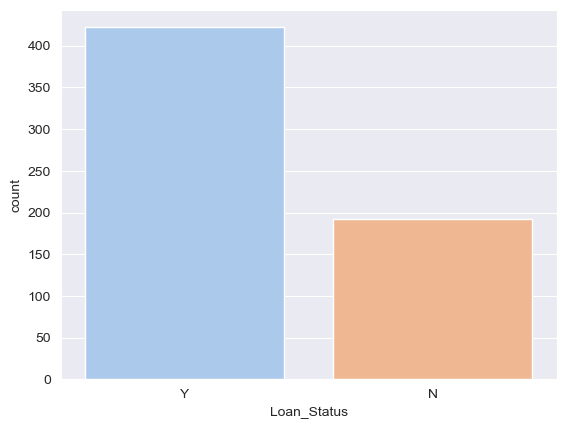

In [19]:
sns.countplot(x='Loan_Status',data=df,palette='pastel')
plt.show()

C:\Users\dnyan\AppData\Local\Temp\ipykernel_23720\2972723771.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax= sns.countplot(x='Loan_Status',data=df,palette='pastel')


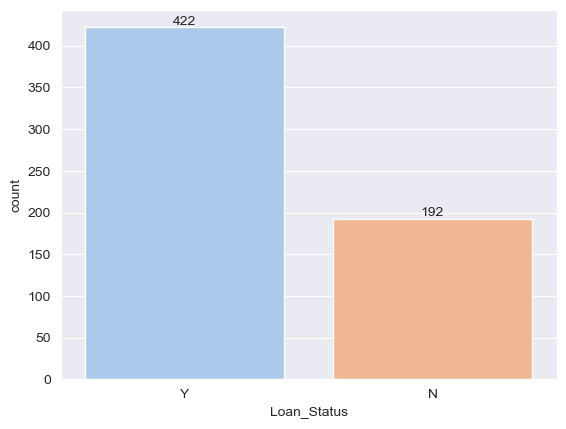

In [20]:
ax= sns.countplot(x='Loan_Status',data=df,palette='pastel')
for bars in ax.containers:
    ax.bar_label(bars)

plt.show()

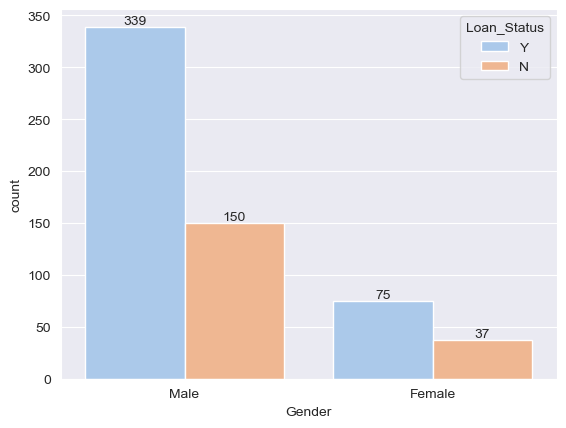

In [21]:
ax= sns.countplot(x='Gender',hue='Loan_Status',data=df,palette='pastel')
for bars in ax.containers:
    ax.bar_label(bars)

plt.show()

Ratio wise, Loan Status acceptance and non acceptance is same for both the Genders. Though, Males have higher number of Applications 

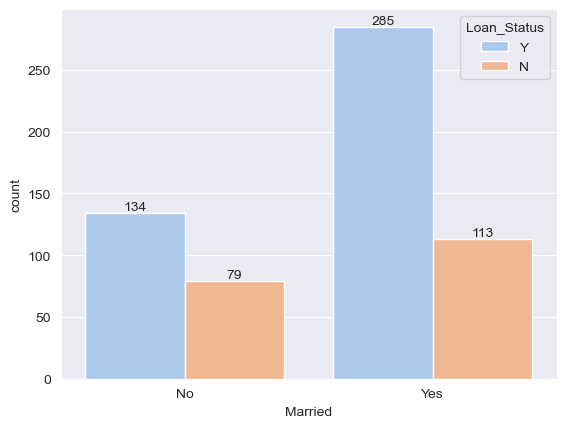

In [22]:
ax= sns.countplot(x='Married',hue='Loan_Status',data=df,palette='pastel')
for bars in ax.containers:
    ax.bar_label(bars)

plt.show()

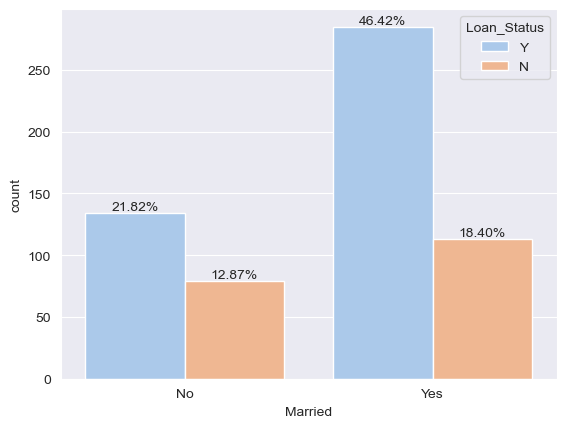

In [23]:
ax = sns.countplot(x='Married', hue='Loan_Status', data=df, palette='pastel')

total = len(df)
for bars in ax.containers:
    labels = [f'{(v.get_height() / total * 100):.2f}%' for v in bars]
    ax.bar_label(bars, labels=labels)
plt.show()


Percentage of Decline of Loan if Applicant is Not Married is higher (50 %), If applicant is Married his approval chances are higher as observed in this graph

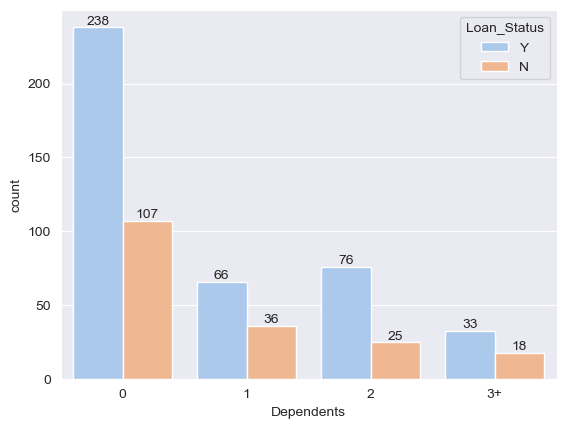

In [24]:
ax= sns.countplot(x='Dependents',hue='Loan_Status',data=df,palette='pastel')
for bars in ax.containers:
    ax.bar_label(bars)

plt.show()

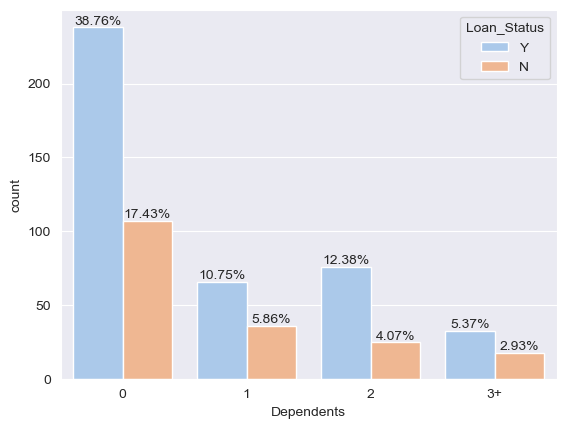

In [25]:
ax = sns.countplot(x='Dependents', hue='Loan_Status', data=df, palette='pastel')

total = len(df)
for bars in ax.containers:
    labels = [f'{(v.get_height() / total * 100):.2f}%' for v in bars]
    ax.bar_label(bars, labels=labels)
plt.show()

Most of Applicants have 0 dependents, and seems like almost 50% decline rate is there in all dependents

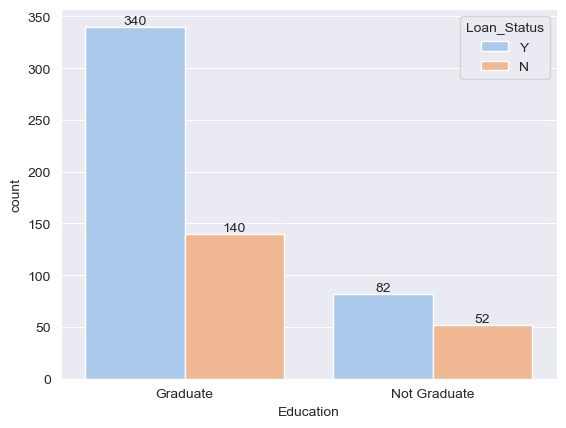

In [26]:
ax= sns.countplot(x='Education',hue='Loan_Status',data=df,palette='pastel')
for bars in ax.containers:
    ax.bar_label(bars)

plt.show()

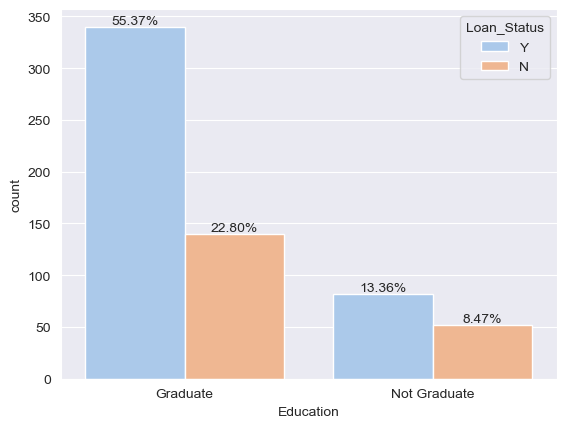

In [27]:
ax = sns.countplot(x='Education', hue='Loan_Status', data=df, palette='pastel')

total = len(df)
for bars in ax.containers:
    labels = [f'{(v.get_height() / total * 100):.2f}%' for v in bars]
    ax.bar_label(bars, labels=labels)
plt.show()

Most of applicants are Grduate and about 50% applications have been rejected from Grduates

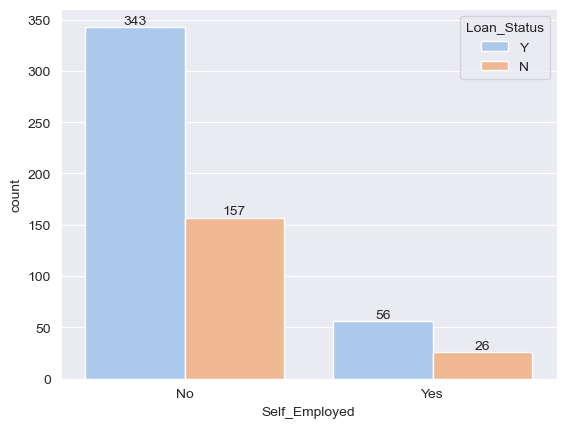

In [28]:
ax= sns.countplot(x='Self_Employed',hue='Loan_Status',data=df,palette='pastel')
for bars in ax.containers:
    ax.bar_label(bars)

plt.show()

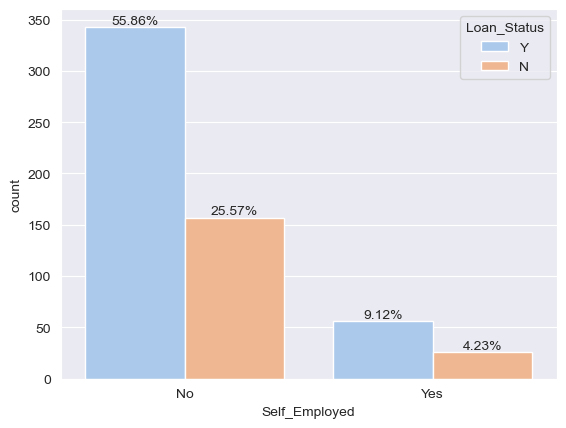

In [29]:
ax = sns.countplot(x='Self_Employed', hue='Loan_Status', data=df, palette='pastel')

total = len(df)
for bars in ax.containers:
    labels = [f'{(v.get_height() / total * 100):.2f}%' for v in bars]
    ax.bar_label(bars, labels=labels)
plt.show()

Same trend observed as earlier graphs

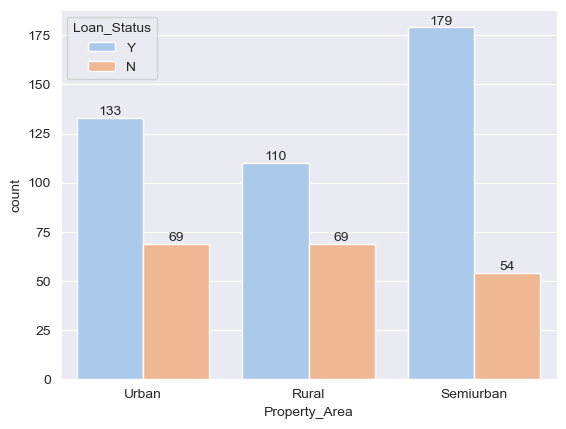

In [30]:
ax= sns.countplot(x='Property_Area',hue='Loan_Status',data=df,palette='pastel')
for bars in ax.containers:
    ax.bar_label(bars)

plt.show()

Rural area has slightly higher rejections than Urban

In [37]:
df_num=df.select_dtypes(exclude='object')

<Figure size 1000x600 with 0 Axes>

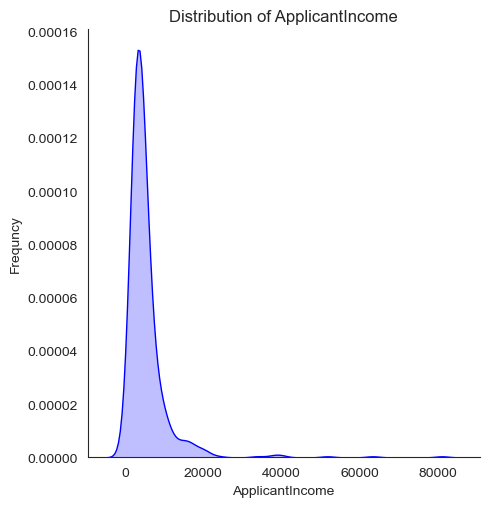

<Figure size 1000x600 with 0 Axes>

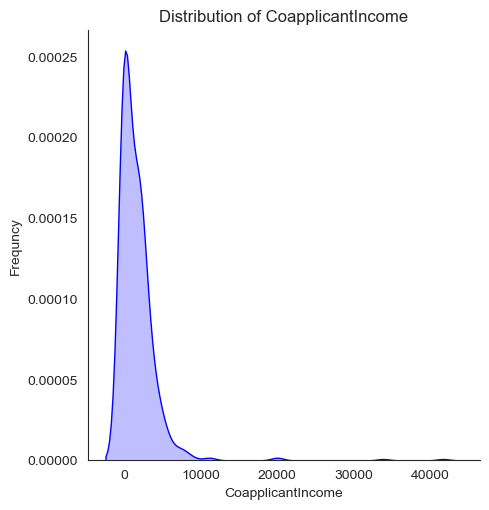

<Figure size 1000x600 with 0 Axes>

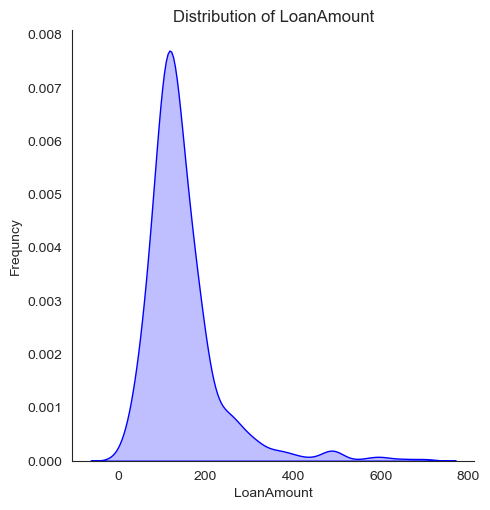

<Figure size 1000x600 with 0 Axes>

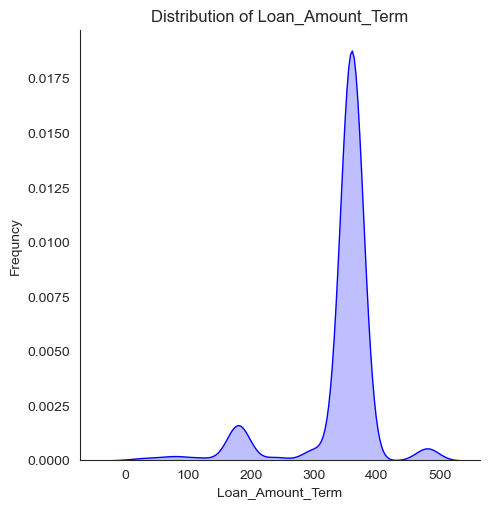

<Figure size 1000x600 with 0 Axes>

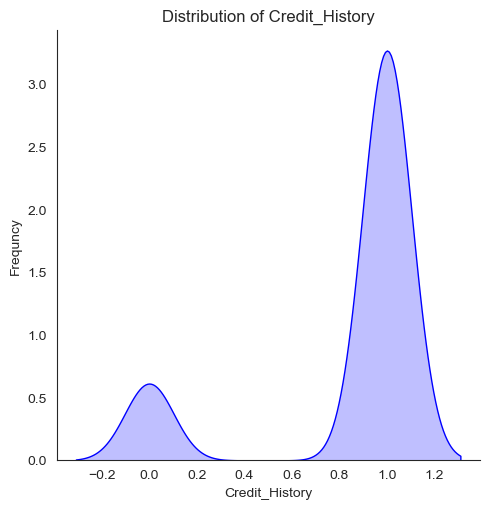

In [38]:
sns.set_style('white')
for column in df_num.columns:
    plt.figure(figsize=(10,6))
    sns.displot(df_num[column],color='blue',kind='kde',fill=True)
    plt.title(f"Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel('Frequncy')
    plt.grid(False)
    plt.show()

Data is left skewed, and there are outliers present. Loan_Amount_Term is Categorical Feature. Most of them have asked for 360-400 months loan term

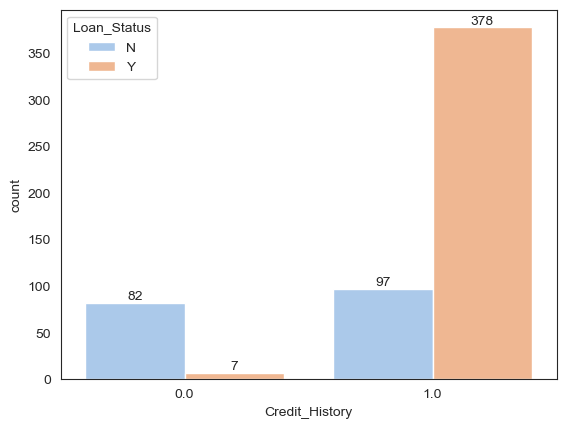

In [39]:
ax= sns.countplot(x='Credit_History',hue='Loan_Status',data=df,palette='pastel')
for bars in ax.containers:
    ax.bar_label(bars)

plt.show()

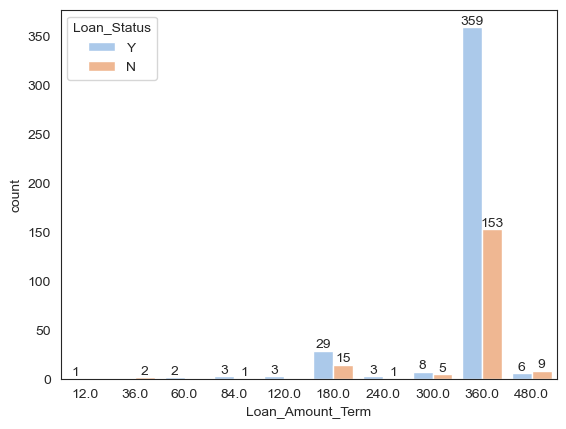

In [40]:
ax= sns.countplot(x='Loan_Amount_Term',hue='Loan_Status',data=df,palette='pastel')
for bars in ax.containers:
    ax.bar_label(bars)

plt.show()

Both of above features are Catrgorical, even though they have dtype of float

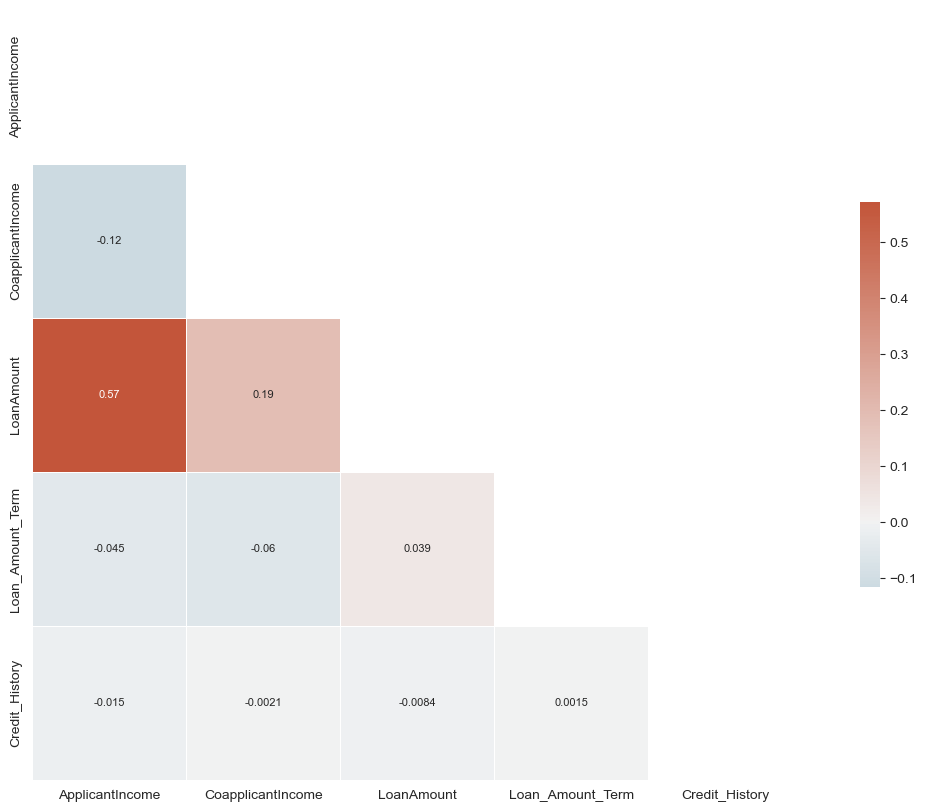

In [42]:
corr = df_num.corr()

mask = np.triu(np.ones_like(corr, dtype=bool))
 
f, ax = plt.subplots(figsize=(15, 10))

cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns.heatmap(corr, mask=mask, cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, annot_kws={"fontsize":8})


plt.show()

Encoding Categorical Fetaures

Handling Missing Values

In [93]:
from sklearn.metrics import euclidean_distances
import numpy as np

def impute_missing_values(df, target_column, reference_column):
    df_copy = df.copy()
    
    missing_rows = df_copy[target_column].isnull()
    
    reference_values = df_copy[[reference_column]].values
    
    distances = euclidean_distances(reference_values, reference_values)
    
    for index in df_copy[missing_rows].index:
        
        similar_rows = np.argsort(distances[index])

        similar_rows = similar_rows[similar_rows != index]

        similar_values = df_copy.loc[similar_rows, target_column].dropna()

        if not similar_values.empty:
            df_copy.loc[index, target_column] = similar_values.mean()
        else:
            df_copy.loc[index, target_column] = df_copy[target_column].mean()
    
    return df_copy

df1 = impute_missing_values(df, target_column='LoanAmount', reference_column='ApplicantIncome')


In [94]:
df1.isnull().sum()

Loan_ID               0
Gender               13
Married               3
Dependents           15
Education             0
Self_Employed        32
ApplicantIncome       0
CoapplicantIncome     0
LoanAmount            0
Loan_Amount_Term     14
Credit_History       50
Property_Area         0
Loan_Status           0
dtype: int64

In [96]:
df1['Credit_History'].fillna(df1['Credit_History'].mode()[0],inplace=True)
df1['Dependents'].fillna(df1['Dependents'].mode()[0], inplace=True)
df1['Loan_Amount_Term'].fillna(df1['Loan_Amount_Term'].mode()[0],inplace=True)
df1['Gender'].fillna(df1['Gender'].mode()[0],inplace=True)
df1['Married'].fillna(df1['Married'].mode()[0],inplace=True)
df1['Self_Employed'].fillna(df1['Self_Employed'].mode()[0],inplace=True)

C:\Users\dnyan\AppData\Local\Temp\ipykernel_23720\770188736.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df1['Credit_History'].fillna(df1['Credit_History'].mode()[0],inplace=True)
C:\Users\dnyan\AppData\Local\Temp\ipykernel_23720\770188736.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always beh

In [97]:
df1.isnull().sum()

Loan_ID              0
Gender               0
Married              0
Dependents           0
Education            0
Self_Employed        0
ApplicantIncome      0
CoapplicantIncome    0
LoanAmount           0
Loan_Amount_Term     0
Credit_History       0
Property_Area        0
Loan_Status          0
dtype: int64

In [105]:
df=df1.copy()

In [107]:
df.isnull().sum()

Loan_ID              0
Gender               0
Married              0
Dependents           0
Education            0
Self_Employed        0
ApplicantIncome      0
CoapplicantIncome    0
LoanAmount           0
Loan_Amount_Term     0
Credit_History       0
Property_Area        0
Loan_Status          0
dtype: int64

In [99]:
df1.to_csv('imputed_df.csv', index=False)

In [100]:
df['Gender']=df['Gender'].map({'Male':1,'Female':0})

In [101]:
df['Married']=df['Married'].map({'Yes':1,'No':0})

In [46]:
df

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
0,LP001002,1.0,0.0,0,Graduate,No,5849,0.0,NaN,360.0,1.0,Urban,Y
1,LP001003,1.0,1.0,1,Graduate,No,4583,1508.0,128.0,360.0,1.0,Rural,N
2,LP001005,1.0,1.0,0,Graduate,Yes,3000,0.0,66.0,360.0,1.0,Urban,Y
3,LP001006,1.0,1.0,0,Not Graduate,No,2583,2358.0,120.0,360.0,1.0,Urban,Y
4,LP001008,1.0,0.0,0,Graduate,No,6000,0.0,141.0,360.0,1.0,Urban,Y
...,...,...,...,...,...,...,...,...,...,...,...,...,...
609,LP002978,0.0,0.0,0,Graduate,No,2900,0.0,71.0,360.0,1.0,Rural,Y
610,LP002979,1.0,1.0,3+,Graduate,No,4106,0.0,40.0,180.0,1.0,Rural,Y
611,LP002983,1.0,1.0,1,Graduate,No,8072,240.0,253.0,360.0,1.0,Urban,Y
612,LP002984,1.0,1.0,2,Graduate,No,7583,0.0,187.0,360.0,1.0,Urban,Y


In [103]:
from sklearn.preprocessing import OrdinalEncoder

encoder=OrdinalEncoder()

In [104]:
df['Education']=encoder.fit_transform(df[['Education']])

In [50]:
df

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
0,LP001002,1.0,0.0,0,0.0,No,5849,0.0,NaN,360.0,1.0,Urban,Y
1,LP001003,1.0,1.0,1,0.0,No,4583,1508.0,128.0,360.0,1.0,Rural,N
2,LP001005,1.0,1.0,0,0.0,Yes,3000,0.0,66.0,360.0,1.0,Urban,Y
3,LP001006,1.0,1.0,0,1.0,No,2583,2358.0,120.0,360.0,1.0,Urban,Y
4,LP001008,1.0,0.0,0,0.0,No,6000,0.0,141.0,360.0,1.0,Urban,Y
...,...,...,...,...,...,...,...,...,...,...,...,...,...
609,LP002978,0.0,0.0,0,0.0,No,2900,0.0,71.0,360.0,1.0,Rural,Y
610,LP002979,1.0,1.0,3+,0.0,No,4106,0.0,40.0,180.0,1.0,Rural,Y
611,LP002983,1.0,1.0,1,0.0,No,8072,240.0,253.0,360.0,1.0,Urban,Y
612,LP002984,1.0,1.0,2,0.0,No,7583,0.0,187.0,360.0,1.0,Urban,Y


Doesnt look ok, Manually encoding 

In [53]:
df

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
0,LP001002,Male,No,0,Graduate,No,5849,0.0,NaN,360.0,1.0,Urban,Y
1,LP001003,Male,Yes,1,Graduate,No,4583,1508.0,128.0,360.0,1.0,Rural,N
2,LP001005,Male,Yes,0,Graduate,Yes,3000,0.0,66.0,360.0,1.0,Urban,Y
3,LP001006,Male,Yes,0,Not Graduate,No,2583,2358.0,120.0,360.0,1.0,Urban,Y
4,LP001008,Male,No,0,Graduate,No,6000,0.0,141.0,360.0,1.0,Urban,Y
...,...,...,...,...,...,...,...,...,...,...,...,...,...
609,LP002978,Female,No,0,Graduate,No,2900,0.0,71.0,360.0,1.0,Rural,Y
610,LP002979,Male,Yes,3+,Graduate,No,4106,0.0,40.0,180.0,1.0,Rural,Y
611,LP002983,Male,Yes,1,Graduate,No,8072,240.0,253.0,360.0,1.0,Urban,Y
612,LP002984,Male,Yes,2,Graduate,No,7583,0.0,187.0,360.0,1.0,Urban,Y


In [108]:
columns_to_dummify = ['Gender', 'Married', 'Education', 'Self_Employed']
dummies = pd.get_dummies(df[columns_to_dummify], drop_first=True)


dummies=dummies*1

dummies.head()

,Gender_Male,Married_Yes,Education_Not Graduate,Self_Employed_Yes
0,1,0,0,0
1,1,1,0,0
2,1,1,0,1
3,1,1,1,0
4,1,0,0,0


In [109]:
df['PropertyArea']=df['Property_Area'].map({'Rural':1,'Semiurban':2,'Urban':3})

In [110]:
df

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status,PropertyArea
0,LP001002,Male,No,0,Graduate,No,5849,0.0,146.412162,360.0,1.0,Urban,Y,3
1,LP001003,Male,Yes,1,Graduate,No,4583,1508.0,128.000000,360.0,1.0,Rural,N,1
2,LP001005,Male,Yes,0,Graduate,Yes,3000,0.0,66.000000,360.0,1.0,Urban,Y,3
3,LP001006,Male,Yes,0,Not Graduate,No,2583,2358.0,120.000000,360.0,1.0,Urban,Y,3
4,LP001008,Male,No,0,Graduate,No,6000,0.0,141.000000,360.0,1.0,Urban,Y,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
609,LP002978,Female,No,0,Graduate,No,2900,0.0,71.000000,360.0,1.0,Rural,Y,1
610,LP002979,Male,Yes,3+,Graduate,No,4106,0.0,40.000000,180.0,1.0,Rural,Y,1
611,LP002983,Male,Yes,1,Graduate,No,8072,240.0,253.000000,360.0,1.0,Urban,Y,3
612,LP002984,Male,Yes,2,Graduate,No,7583,0.0,187.000000,360.0,1.0,Urban,Y,3


In [111]:
df['LoanStatus'] = df['Loan_Status'].apply(lambda x: 1 if x == 'Y' else 0)

In [112]:
df

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status,PropertyArea,LoanStatus
0,LP001002,Male,No,0,Graduate,No,5849,0.0,146.412162,360.0,1.0,Urban,Y,3,1
1,LP001003,Male,Yes,1,Graduate,No,4583,1508.0,128.000000,360.0,1.0,Rural,N,1,0
2,LP001005,Male,Yes,0,Graduate,Yes,3000,0.0,66.000000,360.0,1.0,Urban,Y,3,1
3,LP001006,Male,Yes,0,Not Graduate,No,2583,2358.0,120.000000,360.0,1.0,Urban,Y,3,1
4,LP001008,Male,No,0,Graduate,No,6000,0.0,141.000000,360.0,1.0,Urban,Y,3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
609,LP002978,Female,No,0,Graduate,No,2900,0.0,71.000000,360.0,1.0,Rural,Y,1,1
610,LP002979,Male,Yes,3+,Graduate,No,4106,0.0,40.000000,180.0,1.0,Rural,Y,1,1
611,LP002983,Male,Yes,1,Graduate,No,8072,240.0,253.000000,360.0,1.0,Urban,Y,3,1
612,LP002984,Male,Yes,2,Graduate,No,7583,0.0,187.000000,360.0,1.0,Urban,Y,3,1


In [113]:
ord_encoding_dependents={
    '0':0,
    "1":1,
    "2":2,
    '3+':3
}

df['Dependents_encoded']=df['Dependents'].map(ord_encoding_dependents)

In [114]:
df

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status,PropertyArea,LoanStatus,Dependents_encoded
0,LP001002,Male,No,0,Graduate,No,5849,0.0,146.412162,360.0,1.0,Urban,Y,3,1,0
1,LP001003,Male,Yes,1,Graduate,No,4583,1508.0,128.000000,360.0,1.0,Rural,N,1,0,1
2,LP001005,Male,Yes,0,Graduate,Yes,3000,0.0,66.000000,360.0,1.0,Urban,Y,3,1,0
3,LP001006,Male,Yes,0,Not Graduate,No,2583,2358.0,120.000000,360.0,1.0,Urban,Y,3,1,0
4,LP001008,Male,No,0,Graduate,No,6000,0.0,141.000000,360.0,1.0,Urban,Y,3,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
609,LP002978,Female,No,0,Graduate,No,2900,0.0,71.000000,360.0,1.0,Rural,Y,1,1,0
610,LP002979,Male,Yes,3+,Graduate,No,4106,0.0,40.000000,180.0,1.0,Rural,Y,1,1,3
611,LP002983,Male,Yes,1,Graduate,No,8072,240.0,253.000000,360.0,1.0,Urban,Y,3,1,1
612,LP002984,Male,Yes,2,Graduate,No,7583,0.0,187.000000,360.0,1.0,Urban,Y,3,1,2


In [115]:
df_encoded=pd.concat([df,dummies],axis=1)

In [116]:
df_encoded

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status,PropertyArea,LoanStatus,Dependents_encoded,Gender_Male,Married_Yes,Education_Not Graduate,Self_Employed_Yes
0,LP001002,Male,No,0,Graduate,No,5849,0.0,146.412162,360.0,1.0,Urban,Y,3,1,0,1,0,0,0
1,LP001003,Male,Yes,1,Graduate,No,4583,1508.0,128.000000,360.0,1.0,Rural,N,1,0,1,1,1,0,0
2,LP001005,Male,Yes,0,Graduate,Yes,3000,0.0,66.000000,360.0,1.0,Urban,Y,3,1,0,1,1,0,1
3,LP001006,Male,Yes,0,Not Graduate,No,2583,2358.0,120.000000,360.0,1.0,Urban,Y,3,1,0,1,1,1,0
4,LP001008,Male,No,0,Graduate,No,6000,0.0,141.000000,360.0,1.0,Urban,Y,3,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
609,LP002978,Female,No,0,Graduate,No,2900,0.0,71.000000,360.0,1.0,Rural,Y,1,1,0,0,0,0,0
610,LP002979,Male,Yes,3+,Graduate,No,4106,0.0,40.000000,180.0,1.0,Rural,Y,1,1,3,1,1,0,0
611,LP002983,Male,Yes,1,Graduate,No,8072,240.0,253.000000,360.0,1.0,Urban,Y,3,1,1,1,1,0,0
612,LP002984,Male,Yes,2,Graduate,No,7583,0.0,187.000000,360.0,1.0,Urban,Y,3,1,2,1,1,0,0


Dropping encoded columns and Loan_ID column

In [117]:
df_encoded.drop(['Gender','Married','Education','Dependents','Property_Area','Loan_ID'],axis=1,inplace=True)

In [118]:
df_encoded.drop(['Self_Employed','Loan_Status'],axis=1,inplace=True)

In [120]:
df_encoded

,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,PropertyArea,LoanStatus,Dependents_encoded,Gender_Male,Married_Yes,Education_Not Graduate,Self_Employed_Yes
0,5849,0.0,146.412162,360.0,1.0,3,1,0,1,0,0,0
1,4583,1508.0,128.000000,360.0,1.0,1,0,1,1,1,0,0
2,3000,0.0,66.000000,360.0,1.0,3,1,0,1,1,0,1
3,2583,2358.0,120.000000,360.0,1.0,3,1,0,1,1,1,0
4,6000,0.0,141.000000,360.0,1.0,3,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
609,2900,0.0,71.000000,360.0,1.0,1,1,0,0,0,0,0
610,4106,0.0,40.000000,180.0,1.0,1,1,3,1,1,0,0
611,8072,240.0,253.000000,360.0,1.0,3,1,1,1,1,0,0
612,7583,0.0,187.000000,360.0,1.0,3,1,2,1,1,0,0


In [121]:
from sklearn.metrics import euclidean_distances
def impute_missing_values(df, target_column, reference_column):
    df_copy = df.copy()
    
    missing_rows = df_copy[target_column].isnull()
    
    reference_values = df_copy[[reference_column]].values
    
    distances = euclidean_distances(reference_values, reference_values)
    
    for index in df_copy[missing_rows].index:
        
        similar_rows = np.argsort(distances[index])

        similar_rows = similar_rows[similar_rows != index]

        similar_values = df_copy.loc[similar_rows, target_column].dropna()

        if not similar_values.empty:
            df_copy.loc[index, target_column] = similar_values.mean()
        else:
            df_copy.loc[index, target_column] = df_copy[target_column].mean()
    
    return df_copy

df_encoded = impute_missing_values(df_encoded, target_column='LoanAmount', reference_column='ApplicantIncome')


In [122]:
df_encoded

,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,PropertyArea,LoanStatus,Dependents_encoded,Gender_Male,Married_Yes,Education_Not Graduate,Self_Employed_Yes
0,5849,0.0,146.412162,360.0,1.0,3,1,0,1,0,0,0
1,4583,1508.0,128.000000,360.0,1.0,1,0,1,1,1,0,0
2,3000,0.0,66.000000,360.0,1.0,3,1,0,1,1,0,1
3,2583,2358.0,120.000000,360.0,1.0,3,1,0,1,1,1,0
4,6000,0.0,141.000000,360.0,1.0,3,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
609,2900,0.0,71.000000,360.0,1.0,1,1,0,0,0,0,0
610,4106,0.0,40.000000,180.0,1.0,1,1,3,1,1,0,0
611,8072,240.0,253.000000,360.0,1.0,3,1,1,1,1,0,0
612,7583,0.0,187.000000,360.0,1.0,3,1,2,1,1,0,0


In [123]:
df_encoded.isnull().sum()

ApplicantIncome           0
CoapplicantIncome         0
LoanAmount                0
Loan_Amount_Term          0
Credit_History            0
PropertyArea              0
LoanStatus                0
Dependents_encoded        0
Gender_Male               0
Married_Yes               0
Education_Not Graduate    0
Self_Employed_Yes         0
dtype: int64

In [76]:
df_encoded

,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,PropertyArea,LoanStatus,Dependents_encoded,Gender_Male,Married_Yes,Education_Not Graduate,Self_Employed_Yes
0,5849,0.0,146.412162,360.0,1.0,3,1,0.0,1,0,0,0
1,4583,1508.0,128.000000,360.0,1.0,1,0,1.0,1,1,0,0
2,3000,0.0,66.000000,360.0,1.0,3,1,0.0,1,1,0,1
3,2583,2358.0,120.000000,360.0,1.0,3,1,0.0,1,1,1,0
4,6000,0.0,141.000000,360.0,1.0,3,1,0.0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
609,2900,0.0,71.000000,360.0,1.0,1,1,0.0,0,0,0,0
610,4106,0.0,40.000000,180.0,1.0,1,1,3.0,1,1,0,0
611,8072,240.0,253.000000,360.0,1.0,3,1,1.0,1,1,0,0
612,7583,0.0,187.000000,360.0,1.0,3,1,2.0,1,1,0,0


In [75]:
df_encoded.isnull().sum()

ApplicantIncome           0
CoapplicantIncome         0
LoanAmount                0
Loan_Amount_Term          0
Credit_History            0
PropertyArea              0
LoanStatus                0
Dependents_encoded        0
Gender_Male               0
Married_Yes               0
Education_Not Graduate    0
Self_Employed_Yes         0
dtype: int64

In [77]:
df_encoded['Loan_Amount_Term'].value_counts()

Loan_Amount_Term
360.0    526
180.0     44
480.0     15
300.0     13
240.0      4
84.0       4
120.0      3
60.0       2
36.0       2
12.0       1
Name: count, dtype: int64

In [124]:
df_encoded1=df_encoded.copy()

Saving encoded df for future use

In [125]:
df_encoded.to_csv('encoded_df.csv', index=False)

In [154]:
df=df_encoded.copy()

In [155]:
df.skew()

ApplicantIncome           6.539513
CoapplicantIncome         7.491531
LoanAmount                2.726601
Loan_Amount_Term         -2.402112
Credit_History           -2.021971
PropertyArea             -0.066196
LoanStatus               -0.809998
Dependents_encoded        1.015551
Gender_Male              -1.648795
Married_Yes              -0.644850
Education_Not Graduate    1.367622
Self_Employed_Yes         2.159796
dtype: float64

Skewness within range

In [156]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif= pd.DataFrame()
vif['VIF']= [variance_inflation_factor(df.values,i) for i in range(df.shape[1])]
vif['Features']= df.columns
vif

,VIF,Features
0,2.893434,ApplicantIncome
1,1.489588,CoapplicantIncome
2,6.861459,LoanAmount
3,12.069938,Loan_Amount_Term
4,9.146267,Credit_History
5,6.415308,PropertyArea
6,4.633639,LoanStatus
7,1.793364,Dependents_encoded
8,6.036849,Gender_Male
9,3.703013,Married_Yes


In [157]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   ApplicantIncome         614 non-null    int64  
 1   CoapplicantIncome       614 non-null    float64
 2   LoanAmount              614 non-null    float64
 3   Loan_Amount_Term        614 non-null    float64
 4   Credit_History          614 non-null    float64
 5   PropertyArea            614 non-null    int64  
 6   LoanStatus              614 non-null    int64  
 7   Dependents_encoded      614 non-null    int64  
 8   Gender_Male             614 non-null    int32  
 9   Married_Yes             614 non-null    int32  
 10  Education_Not Graduate  614 non-null    int32  
 11  Self_Employed_Yes       614 non-null    int32  
dtypes: float64(4), int32(4), int64(4)
memory usage: 48.1 KB


In [158]:
Numeric=['ApplicantIncome', 'CoapplicantIncome', 'LoanAmount']

In [159]:
from scipy import stats
def count_outliers_zscore(df):
    outliers_count = {}
    for column in Numeric:
        z_scores = stats.zscore(df[column])
        outliers = ((z_scores > 3) | (z_scores < -3)).sum()
        outliers_count[column] = outliers
    return outliers_count

def count_outliers_iqr(df):
    outliers_count = {}
    for column in Numeric:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        outliers = ((df[column] < (Q1 - 1.5 * IQR)) | (df[column] > (Q3 + 1.5 * IQR))).sum()
        outliers_count[column] = outliers
    return outliers_count

outliers_zscore = count_outliers_zscore(df)
outliers_iqr = count_outliers_iqr(df)

outliers_df = pd.DataFrame({'Z-score outliers': outliers_zscore, 'IQR outliers': outliers_iqr})

print(outliers_df)

                   Z-score outliers  IQR outliers
ApplicantIncome                   8            50
CoapplicantIncome                 6            18
LoanAmount                       15            41


In [160]:
def drop_outliers_zscore(df, numeric_columns, threshold=3):
    df_clean = df.copy()
    
    rows_to_drop = set()
    
    for column in numeric_columns:
        if column in df_clean.columns:
            z_scores = stats.zscore(df_clean[column].dropna()) 
            outliers = (abs(z_scores) > threshold)
            outlier_indices = df_clean.index[df_clean[column].notna()][outliers]
            rows_to_drop.update(outlier_indices)
    
    df_clean = df_clean.drop(index=rows_to_drop)
    
    return df_clean

df_clean = drop_outliers_zscore(df, Numeric)

In [161]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 589 entries, 0 to 613
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   ApplicantIncome         589 non-null    int64  
 1   CoapplicantIncome       589 non-null    float64
 2   LoanAmount              589 non-null    float64
 3   Loan_Amount_Term        589 non-null    float64
 4   Credit_History          589 non-null    float64
 5   PropertyArea            589 non-null    int64  
 6   LoanStatus              589 non-null    int64  
 7   Dependents_encoded      589 non-null    int64  
 8   Gender_Male             589 non-null    int32  
 9   Married_Yes             589 non-null    int32  
 10  Education_Not Graduate  589 non-null    int32  
 11  Self_Employed_Yes       589 non-null    int32  
dtypes: float64(4), int32(4), int64(4)
memory usage: 50.6 KB


In [162]:
df=df_clean.copy()

In [163]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 589 entries, 0 to 613
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   ApplicantIncome         589 non-null    int64  
 1   CoapplicantIncome       589 non-null    float64
 2   LoanAmount              589 non-null    float64
 3   Loan_Amount_Term        589 non-null    float64
 4   Credit_History          589 non-null    float64
 5   PropertyArea            589 non-null    int64  
 6   LoanStatus              589 non-null    int64  
 7   Dependents_encoded      589 non-null    int64  
 8   Gender_Male             589 non-null    int32  
 9   Married_Yes             589 non-null    int32  
 10  Education_Not Graduate  589 non-null    int32  
 11  Self_Employed_Yes       589 non-null    int32  
dtypes: float64(4), int32(4), int64(4)
memory usage: 50.6 KB


In [129]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler,RobustScaler
from imblearn.over_sampling import SMOTE, ADASYN
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTETomek, SMOTEENN
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.linear_model import LogisticRegression, RidgeClassifier, Perceptron
from sklearn.svm import SVC, LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis

In [179]:
df = df.reset_index()

In [180]:
X=df.drop(['LoanStatus'],axis=1)
y=df['LoanStatus']

In [181]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=57)

scaler = RobustScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

Processing with imbalance handling: None (Balanced Class Weight)


c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Processing with imbalance handling: SMOTE


c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Processing with imbalance handling: ADASYN


c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Processing with imbalance handling: Random Under-Sampling


c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Processing with imbalance handling: SMOTE + Tomek


c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Processing with imbalance handling: SMOTEENN


c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


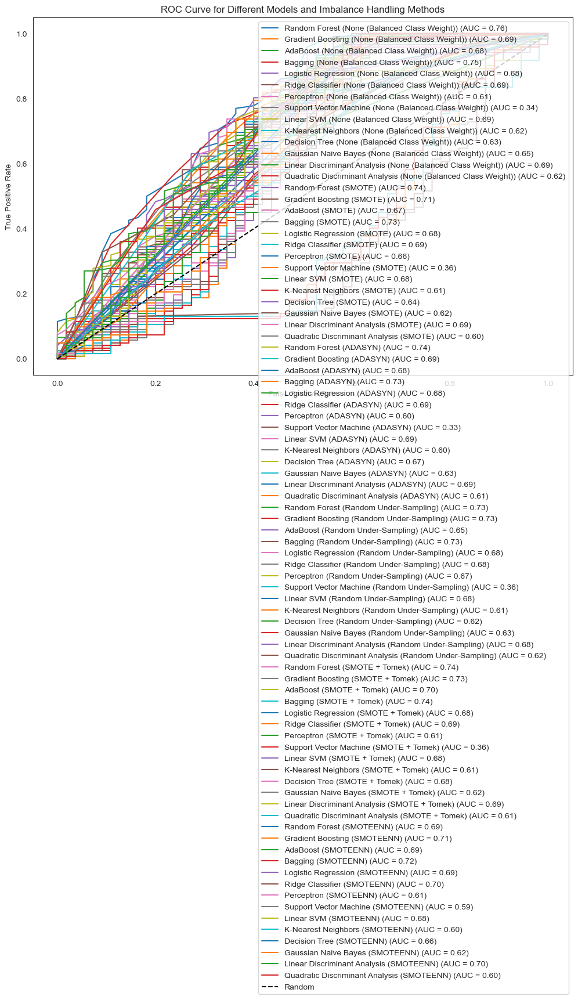

In [166]:
imbalance_methods = {
    "None (Balanced Class Weight)": None, 
    "SMOTE": SMOTE(random_state=47),
    "ADASYN": ADASYN(random_state=47),
    "Random Under-Sampling": RandomUnderSampler(random_state=47),
    "SMOTE + Tomek": SMOTETomek(random_state=47),
    "SMOTEENN": SMOTEENN(random_state=47)
}

models = {
    "Random Forest": RandomForestClassifier(class_weight='balanced', random_state=47),
    "Gradient Boosting": GradientBoostingClassifier(random_state=47),
    "AdaBoost": AdaBoostClassifier(random_state=47),
    "Bagging": BaggingClassifier(random_state=47),
    "Logistic Regression": LogisticRegression(max_iter=1000, class_weight='balanced', random_state=47),
    "Ridge Classifier": RidgeClassifier(class_weight='balanced', random_state=47),
    "Perceptron": Perceptron(class_weight='balanced', random_state=47),
    "Support Vector Machine": SVC(class_weight='balanced', random_state=47, probability=True),
    "Linear SVM": LinearSVC(class_weight='balanced', random_state=47),
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "Decision Tree": DecisionTreeClassifier(class_weight='balanced', random_state=47),
    "Gaussian Naive Bayes": GaussianNB(),
    "Linear Discriminant Analysis": LinearDiscriminantAnalysis(),
    "Quadratic Discriminant Analysis": QuadraticDiscriminantAnalysis()
}

plt.figure(figsize=(12, 8))

for imb_name, imb_method in imbalance_methods.items():
    print(f"Processing with imbalance handling: {imb_name}")
    
    if imb_method is not None:
        X_res, y_res = imb_method.fit_resample(X_train_scaled, y_train)
    else:
        X_res, y_res = X_train_scaled, y_train  
    
    for model_name, model in models.items():
        model.fit(X_res, y_res)  
        
        if hasattr(model, "predict_proba"):
            y_prob = model.predict_proba(X_test_scaled)[:, 1]
        else:
            y_prob = model.decision_function(X_test_scaled)
        
        fpr, tpr, _ = roc_curve(y_test, y_prob)
        auc = roc_auc_score(y_test, y_prob)
        
        plt.plot(fpr, tpr, label=f'{model_name} ({imb_name}) (AUC = {auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Different Models and Imbalance Handling Methods')
plt.legend(loc='best')
plt.show()

Adaboost with ADASYN and Bagging Classifier without any imbalance methods works similar, lets further

In [167]:
from sklearn.model_selection import GridSearchCV

Fitting 5 folds for each of 272 candidates, totalling 1360 fits


c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\numpy\ma\core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,
c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\model_selection\_search.py:1102: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan

Best ADASYN Parameters: {'n_neighbors': 3, 'random_state': 1, 'sampling_strategy': 'minority'}
Fitting 5 folds for each of 952 candidates, totalling 4760 fits
Best AdaBoost Parameters: {'criterion': 'gini', 'max_depth': 15, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 16}

Classification Report:
              precision    recall  f1-score   support

           0       0.66      0.45      0.54        55
           1       0.78      0.89      0.84       122

    accuracy                           0.76       177
   macro avg       0.72      0.67      0.69       177
weighted avg       0.74      0.76      0.74       177



c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
920 fits failed out of a total of 4760.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
680 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "c:\

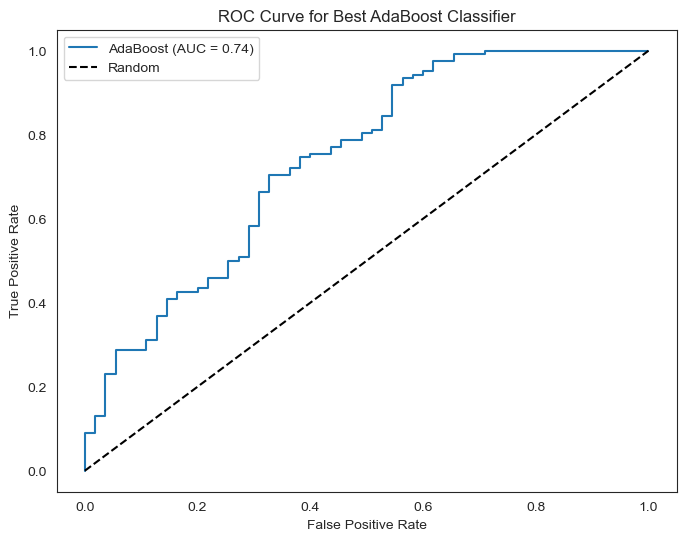

Train Accuracy: 0.9556
Test Accuracy: 0.7571


In [169]:
adasyn_param_grid = {
    'n_neighbors': [3, 5, 7, 10],
    'sampling_strategy': ['minority', 'not majority', 0.5, 0.75],
    'random_state': np.arange(1, 50, 3)
}

adasyn = ADASYN()
adasyn_grid_search = GridSearchCV(estimator=adasyn, param_grid=adasyn_param_grid, scoring='roc_auc', cv=5, n_jobs=-1, verbose=2)

adasyn_grid_search.fit(X_train_scaled, y_train)

best_adasyn = adasyn_grid_search.best_estimator_
print(f"Best ADASYN Parameters: {adasyn_grid_search.best_params_}")

X_train_adsyn, y_train_adsyn = best_adasyn.fit_resample(X_train_scaled, y_train)

grid_param = {
    'n_estimators':np.arange(0,17),
    'criterion': ['gini', 'entropy'],
    'max_depth' : [10,15],
    'min_samples_leaf' : np.arange(0,7),
    'min_samples_split' : [10,11]
}


rf = RandomForestClassifier()
grid_search = GridSearchCV(estimator=rf, param_grid=grid_param, scoring='roc_auc', cv=5, n_jobs=-1, verbose=2)

grid_search.fit(X_train_adsyn, y_train_adsyn)

best_rf = grid_search.best_estimator_
print(f"Best AdaBoost Parameters: {grid_search.best_params_}")

y_pred = best_rf.predict(X_test_scaled)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

y_prob = best_rf.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
auc = roc_auc_score(y_test, y_prob)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'AdaBoost (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Best AdaBoost Classifier')
plt.legend(loc='best')
plt.show()

def metric_score(model, X_train, X_test, y_train, y_test, train=True):
    if train:
        y_train_pred = model.predict(X_train)
        print(f"Train Accuracy: {np.mean(y_train_pred == y_train):.4f}")
    else:
        y_test_pred = model.predict(X_test)
        print(f"Test Accuracy: {np.mean(y_test_pred == y_test):.4f}")

metric_score(best_rf, X_train_adsyn, X_test_scaled, y_train_adsyn, y_test, train=True)
metric_score(best_rf, X_train_adsyn, X_test_scaled, y_train_adsyn, y_test, train=False)


Fitting 5 folds for each of 16184 candidates, totalling 80920 fits


c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
15640 fits failed out of a total of 80920.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
11560 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File

Best AdaBoost Parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 3, 'min_samples_split': 11, 'n_estimators': 8, 'random_state': 31}

Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.38      0.52        55
           1       0.77      0.96      0.86       122

    accuracy                           0.78       177
   macro avg       0.79      0.67      0.69       177
weighted avg       0.79      0.78      0.75       177



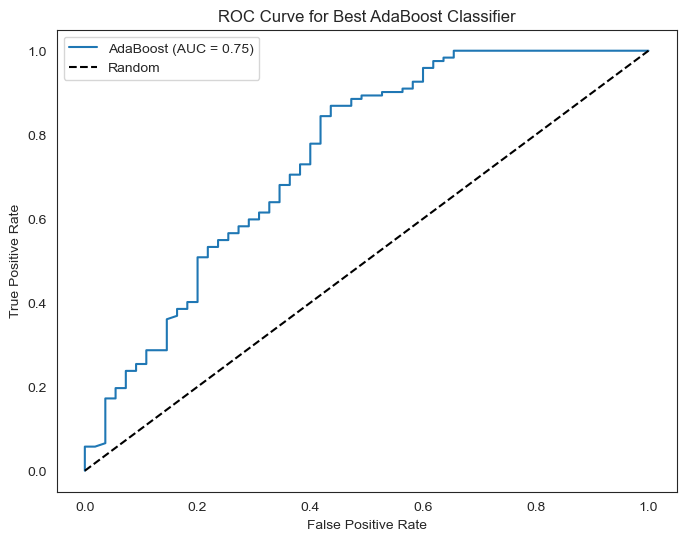

Train Accuracy: 0.8665
Test Accuracy: 0.7797


In [171]:
grid_param = {
    'n_estimators':np.arange(0,17),
    'criterion': ['gini', 'entropy'],
    'max_depth' : [10,15],
    'min_samples_leaf' : np.arange(0,7),
    'min_samples_split' : [10,11],
    'random_state': np.arange(1, 50, 3)
}


rf = RandomForestClassifier()
grid_search = GridSearchCV(estimator=rf, param_grid=grid_param, scoring='roc_auc', cv=5, n_jobs=-1, verbose=2)

grid_search.fit(X_train_scaled, y_train)

best_rf = grid_search.best_estimator_
print(f"Best AdaBoost Parameters: {grid_search.best_params_}")

y_pred = best_rf.predict(X_test_scaled)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

y_prob = best_rf.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
auc = roc_auc_score(y_test, y_prob)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'AdaBoost (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Best AdaBoost Classifier')
plt.legend(loc='best')
plt.show()

def metric_score(model, X_train, X_test, y_train, y_test, train=True):
    if train:
        y_train_pred = model.predict(X_train)
        print(f"Train Accuracy: {np.mean(y_train_pred == y_train):.4f}")
    else:
        y_test_pred = model.predict(X_test)
        print(f"Test Accuracy: {np.mean(y_test_pred == y_test):.4f}")

metric_score(best_rf, X_train_scaled, X_test_scaled, y_train, y_test, train=True)
metric_score(best_rf, X_train_scaled, X_test_scaled, y_train, y_test, train=False)


In [172]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, roc_auc_score
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from xgboost import XGBClassifier
import lightgbm as lgb


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=57)


scaler = RobustScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

models = {
    "XGBoost": XGBClassifier(eval_metric='mlogloss', use_label_encoder=False, random_state=42),
    "LightGBM": lgb.LGBMClassifier(random_state=42)
}


param_grids = {
    "XGBoost": {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 6, 10],
        'subsample': [0.8, 1.0],
        'colsample_bytree': [0.8, 1.0]
    },
    "LightGBM": {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.2],
        'num_leaves': [31, 50, 70],
        'max_depth': [-1, 10, 20],
        'subsample': [0.8, 1.0]
    }
}


best_models = {}

for name, model in models.items():
    print(f"Training and tuning {name}...")
    grid_search = GridSearchCV(estimator=model, param_grid=param_grids[name], cv=5, n_jobs=-1, scoring='roc_auc')
    grid_search.fit(X_train_scaled, y_train)
    best_models[name] = grid_search.best_estimator_


print("Evaluation Results:\n")

for name, model in best_models.items():
    y_pred = model.predict(X_test_scaled)
    y_prob = model.predict_proba(X_test_scaled)[:, 1]
    
    print(f"{name} Classification Report:")
    print(classification_report(y_test, y_pred))
    print(f"{name} ROC-AUC: {roc_auc_score(y_test, y_prob):.3f}")
    print('---------------------------------------------------')


Training and tuning XGBoost...


c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\xgboost\core.py:158: UserWarning: [18:18:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Training and tuning LightGBM...
[LightGBM] [Info] Number of positive: 284, number of negative: 128
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000401 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 412, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.689320 -> initscore=0.796944
[LightGBM] [Info] Start training from score 0.796944
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

In [177]:
from sklearn.base import clone
from sklearn.model_selection import StratifiedKFold

In [184]:
df['TotalIncome'] = df['ApplicantIncome'] + df['CoapplicantIncome']

In [185]:
df['IncomeRatio'] = df['ApplicantIncome'] / (df['CoapplicantIncome'] + 1)

In [186]:
df['LoanToIncomeRatio'] = df['LoanAmount'] / (df['TotalIncome'] + 1)


In [188]:
df

,index,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,PropertyArea,LoanStatus,Dependents_encoded,Gender_Male,Married_Yes,Education_Not Graduate,Self_Employed_Yes,TotalIncome,IncomeRatio,LoanToIncomeRatio
0,0,5849,0.0,146.412162,360.0,1.0,3,1,0,1,0,0,0,5849.0,5849.000000,0.025028
1,1,4583,1508.0,128.000000,360.0,1.0,1,0,1,1,1,0,0,6091.0,3.037111,0.021011
2,2,3000,0.0,66.000000,360.0,1.0,3,1,0,1,1,0,1,3000.0,3000.000000,0.021993
3,3,2583,2358.0,120.000000,360.0,1.0,3,1,0,1,1,1,0,4941.0,1.094955,0.024282
4,4,6000,0.0,141.000000,360.0,1.0,3,1,0,1,0,0,0,6000.0,6000.000000,0.023496
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
584,609,2900,0.0,71.000000,360.0,1.0,1,1,0,0,0,0,0,2900.0,2900.000000,0.024474
585,610,4106,0.0,40.000000,180.0,1.0,1,1,3,1,1,0,0,4106.0,4106.000000,0.009739
586,611,8072,240.0,253.000000,360.0,1.0,3,1,1,1,1,0,0,8312.0,33.493776,0.030434
587,612,7583,0.0,187.000000,360.0,1.0,3,1,2,1,1,0,0,7583.0,7583.000000,0.024657


In [192]:
df['SelfEmployed_LoanAmount'] = df['Self_Employed_Yes'] * df['LoanAmount']


In [193]:
df

,index,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,PropertyArea,LoanStatus,Dependents_encoded,Gender_Male,Married_Yes,Education_Not Graduate,Self_Employed_Yes,TotalIncome,IncomeRatio,LoanToIncomeRatio,SelfEmployed_LoanAmount
0,0,5849,0.0,146.412162,360.0,1.0,3,1,0,1,0,0,0,5849.0,5849.000000,0.025028,0.0
1,1,4583,1508.0,128.000000,360.0,1.0,1,0,1,1,1,0,0,6091.0,3.037111,0.021011,0.0
2,2,3000,0.0,66.000000,360.0,1.0,3,1,0,1,1,0,1,3000.0,3000.000000,0.021993,66.0
3,3,2583,2358.0,120.000000,360.0,1.0,3,1,0,1,1,1,0,4941.0,1.094955,0.024282,0.0
4,4,6000,0.0,141.000000,360.0,1.0,3,1,0,1,0,0,0,6000.0,6000.000000,0.023496,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
584,609,2900,0.0,71.000000,360.0,1.0,1,1,0,0,0,0,0,2900.0,2900.000000,0.024474,0.0
585,610,4106,0.0,40.000000,180.0,1.0,1,1,3,1,1,0,0,4106.0,4106.000000,0.009739,0.0
586,611,8072,240.0,253.000000,360.0,1.0,3,1,1,1,1,0,0,8312.0,33.493776,0.030434,0.0
587,612,7583,0.0,187.000000,360.0,1.0,3,1,2,1,1,0,0,7583.0,7583.000000,0.024657,0.0


In [194]:
X=df.drop(['LoanStatus'],axis=1)
y=df['LoanStatus']

In [195]:
from sklearn.preprocessing import MinMaxScaler

In [196]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=57)

scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [199]:
from imblearn.over_sampling import RandomOverSampler

Processing with imbalance handling: None (Balanced Class Weight)


c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\discriminant_analysis.py:947: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


Processing with imbalance handling: SMOTE


c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\discriminant_analysis.py:947: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


Processing with imbalance handling: ADASYN


c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\discriminant_analysis.py:947: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


Processing with imbalance handling: Random Under-Sampling


c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\discriminant_analysis.py:947: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


Processing with imbalance handling: Random Over Sampling


c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\discriminant_analysis.py:947: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


Processing with imbalance handling: SMOTE + Tomek


c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\discriminant_analysis.py:947: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


Processing with imbalance handling: SMOTEENN


c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\discriminant_analysis.py:947: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


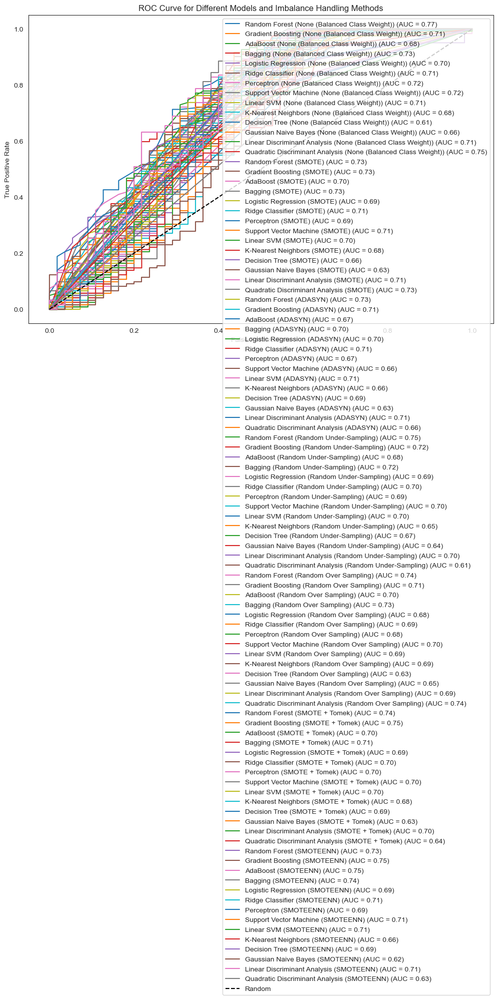

In [200]:
imbalance_methods = {
    "None (Balanced Class Weight)": None, 
    "SMOTE": SMOTE(random_state=47),
    "ADASYN": ADASYN(random_state=47),
    "Random Under-Sampling": RandomUnderSampler(random_state=47),
    "Random Over Sampling":RandomOverSampler(),
    "SMOTE + Tomek": SMOTETomek(random_state=47),
    "SMOTEENN": SMOTEENN(random_state=47)
}

models = {
    "Random Forest": RandomForestClassifier(class_weight='balanced', random_state=47),
    "Gradient Boosting": GradientBoostingClassifier(random_state=47),
    "AdaBoost": AdaBoostClassifier(random_state=47),
    "Bagging": BaggingClassifier(random_state=47),
    "Logistic Regression": LogisticRegression(max_iter=1000, class_weight='balanced', random_state=47),
    "Ridge Classifier": RidgeClassifier(class_weight='balanced', random_state=47),
    "Perceptron": Perceptron(class_weight='balanced', random_state=47),
    "Support Vector Machine": SVC(class_weight='balanced', random_state=47, probability=True),
    "Linear SVM": LinearSVC(class_weight='balanced', random_state=47),
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "Decision Tree": DecisionTreeClassifier(class_weight='balanced', random_state=47),
    "Gaussian Naive Bayes": GaussianNB(),
    "Linear Discriminant Analysis": LinearDiscriminantAnalysis(),
    "Quadratic Discriminant Analysis": QuadraticDiscriminantAnalysis()
}

plt.figure(figsize=(12, 8))

for imb_name, imb_method in imbalance_methods.items():
    print(f"Processing with imbalance handling: {imb_name}")
    
    if imb_method is not None:
        X_res, y_res = imb_method.fit_resample(X_train_scaled, y_train)
    else:
        X_res, y_res = X_train_scaled, y_train  
    
    for model_name, model in models.items():
        model.fit(X_res, y_res)  
        
        if hasattr(model, "predict_proba"):
            y_prob = model.predict_proba(X_test_scaled)[:, 1]
        else:
            y_prob = model.decision_function(X_test_scaled)
        
        fpr, tpr, _ = roc_curve(y_test, y_prob)
        auc = roc_auc_score(y_test, y_prob)
        
        plt.plot(fpr, tpr, label=f'{model_name} ({imb_name}) (AUC = {auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Different Models and Imbalance Handling Methods')
plt.legend(loc='best')
plt.show()

Fitting 5 folds for each of 272 candidates, totalling 1360 fits


c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\model_selection\_search.py:1102: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan

Best ADASYN Parameters: {'n_neighbors': 3, 'random_state': 1, 'sampling_strategy': 'minority'}
Fitting 5 folds for each of 952 candidates, totalling 4760 fits
Best AdaBoost Parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 15}

Classification Report:
              precision    recall  f1-score   support

           0       0.62      0.51      0.56        55
           1       0.80      0.86      0.83       122

    accuracy                           0.75       177
   macro avg       0.71      0.68      0.69       177
weighted avg       0.74      0.75      0.74       177



c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
920 fits failed out of a total of 4760.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
680 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "c:\

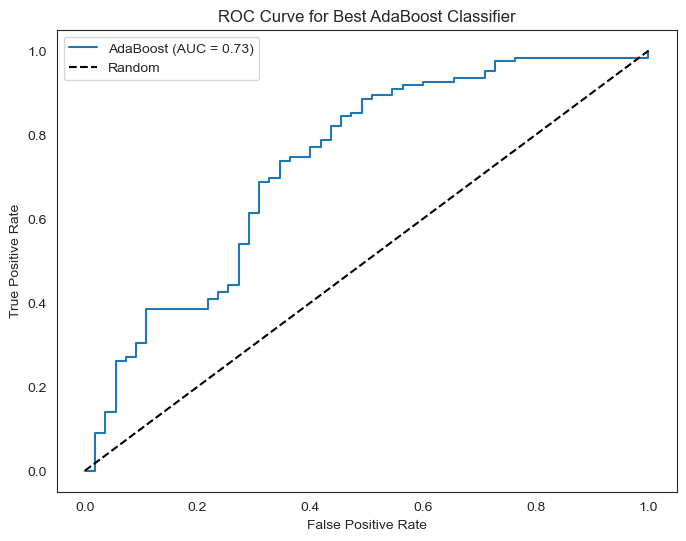

Train Accuracy: 0.9402
Test Accuracy: 0.7514


In [198]:
adasyn_param_grid = {
    'n_neighbors': [3, 5, 7, 10],
    'sampling_strategy': ['minority', 'not majority', 0.5, 0.75],
    'random_state': np.arange(1, 50, 3)
}

adasyn = ADASYN()
adasyn_grid_search = GridSearchCV(estimator=adasyn, param_grid=adasyn_param_grid, scoring='roc_auc', cv=5, n_jobs=-1, verbose=2)

adasyn_grid_search.fit(X_train_scaled, y_train)

best_adasyn = adasyn_grid_search.best_estimator_
print(f"Best ADASYN Parameters: {adasyn_grid_search.best_params_}")

X_train_adsyn, y_train_adsyn = best_adasyn.fit_resample(X_train_scaled, y_train)

grid_param = {
    'n_estimators':np.arange(0,17),
    'criterion': ['gini', 'entropy'],
    'max_depth' : [10,15],
    'min_samples_leaf' : np.arange(0,7),
    'min_samples_split' : [10,11]
}


rf = RandomForestClassifier()
grid_search = GridSearchCV(estimator=rf, param_grid=grid_param, scoring='roc_auc', cv=5, n_jobs=-1, verbose=2)

grid_search.fit(X_train_adsyn, y_train_adsyn)

best_rf = grid_search.best_estimator_
print(f"Best AdaBoost Parameters: {grid_search.best_params_}")

y_pred = best_rf.predict(X_test_scaled)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

y_prob = best_rf.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
auc = roc_auc_score(y_test, y_prob)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'AdaBoost (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Best AdaBoost Classifier')
plt.legend(loc='best')
plt.show()

def metric_score(model, X_train, X_test, y_train, y_test, train=True):
    if train:
        y_train_pred = model.predict(X_train)
        print(f"Train Accuracy: {np.mean(y_train_pred == y_train):.4f}")
    else:
        y_test_pred = model.predict(X_test)
        print(f"Test Accuracy: {np.mean(y_test_pred == y_test):.4f}")

metric_score(best_rf, X_train_adsyn, X_test_scaled, y_train_adsyn, y_test, train=True)
metric_score(best_rf, X_train_adsyn, X_test_scaled, y_train_adsyn, y_test, train=False)


Fitting 5 folds for each of 39984 candidates, totalling 199920 fits


c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
114240 fits failed out of a total of 199920.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
37379 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "c:\Users\dnyan\.conda\envs\ml_env\Lib\site-packages\sklearn\base.py", line 666, in _validate_params
    validate_parameter_constraints(
  Fi

Best Random Forest Parameters: {'bootstrap': True, 'criterion': 'entropy', 'max_depth': 10, 'max_features': 'log2', 'min_samples_leaf': 5, 'min_samples_split': 11, 'n_estimators': 10, 'random_state': 16}

Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.44      0.55        55
           1       0.79      0.93      0.85       122

    accuracy                           0.78       177
   macro avg       0.77      0.69      0.70       177
weighted avg       0.77      0.78      0.76       177



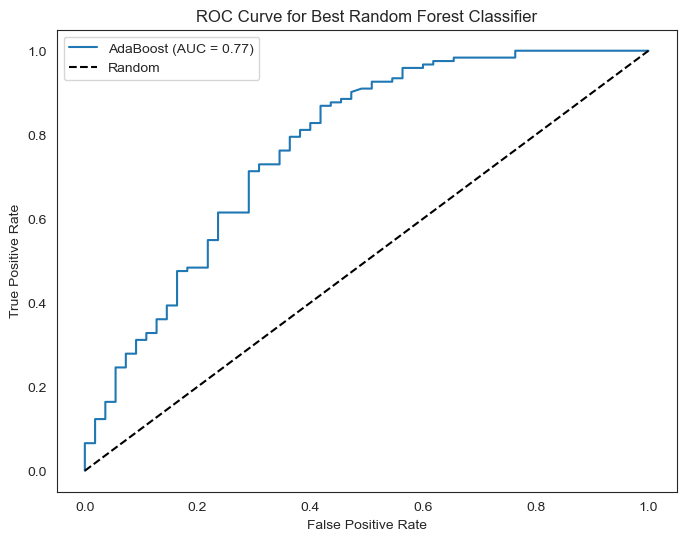

Train Accuracy: 0.8762
Test Accuracy: 0.7797


In [204]:
grid_param = {
    'bootstrap': [True],
    'criterion': ['gini', 'entropy'],
    'min_samples_leaf' : np.arange(0,7),
    'min_samples_split' : [10,11],
    'random_state': np.arange(1, 50, 3),
    'max_depth': [5, 10,20,40,50,60], 
    'max_features': ['auto', 'log2'], 
    'n_estimators': [5, 10, 15 ,25,50,60,70]
}


rf = RandomForestClassifier()
grid_search = GridSearchCV(estimator=rf, param_grid=grid_param, scoring='roc_auc', cv=5, n_jobs=-1, verbose=2)

grid_search.fit(X_train_scaled, y_train)

best_rf = grid_search.best_estimator_
print(f"Best Random Forest Parameters: {grid_search.best_params_}")

y_pred = best_rf.predict(X_test_scaled)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

y_prob = best_rf.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
auc = roc_auc_score(y_test, y_prob)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'AdaBoost (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Best Random Forest Classifier')
plt.legend(loc='best')
plt.show()

def metric_score(model, X_train, X_test, y_train, y_test, train=True):
    if train:
        y_train_pred = model.predict(X_train)
        print(f"Train Accuracy: {np.mean(y_train_pred == y_train):.4f}")
    else:
        y_test_pred = model.predict(X_test)
        print(f"Test Accuracy: {np.mean(y_test_pred == y_test):.4f}")

metric_score(best_rf, X_train_scaled, X_test_scaled, y_train, y_test, train=True)
metric_score(best_rf, X_train_scaled, X_test_scaled, y_train, y_test, train=False)


In [217]:
import warnings

warnings.filterwarnings("ignore")


In [218]:
from sklearn.base import BaseEstimator, ClassifierMixin, clone
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import (RandomForestClassifier, GradientBoostingClassifier, 
                              AdaBoostClassifier, BaggingClassifier)
from sklearn.linear_model import LogisticRegression, RidgeClassifier, Perceptron
from sklearn.svm import SVC, LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.discriminant_analysis import (LinearDiscriminantAnalysis, 
                                            QuadraticDiscriminantAnalysis)
from sklearn.naive_bayes import GaussianNB

class StackingClassifier(BaseEstimator, ClassifierMixin):
    def __init__(self, base_models, meta_model, n_folds=5):
        self.base_models = base_models
        self.meta_model = meta_model
        self.n_folds = n_folds

    def fit(self, X, y):
        self.base_models_ = [list() for _ in self.base_models]
        self.meta_model_ = clone(self.meta_model)
    
        kfold = StratifiedKFold(n_splits=self.n_folds, shuffle=True, random_state=42)
        oof_predictions = np.zeros((X.shape[0], len(self.base_models)))

        for i, model in enumerate(self.base_models):
            for train_idx, valid_idx in kfold.split(X, y):
                instance = clone(model)
                self.base_models_[i].append(instance)
            # Use NumPy indexing directly
                instance.fit(X[train_idx], y[train_idx])
                oof_predictions[valid_idx, i] = instance.predict(X[valid_idx])

        self.meta_model_.fit(oof_predictions, y)
        return self


    def predict(self, X):
        meta_features = np.column_stack([
            np.column_stack([model.predict(X) for model in base_models]).mean(axis=1)
            for base_models in self.base_models_
        ])
        return self.meta_model_.predict(meta_features)

    def predict_proba(self, X):
        meta_features = np.column_stack([
            np.column_stack([model.predict(X) for model in base_models]).mean(axis=1)
            for base_models in self.base_models_
        ])
        return self.meta_model_.predict_proba(meta_features)
base_models = [
    RandomForestClassifier(n_estimators=100, random_state=42),
    SVC(probability=True, random_state=42),
    GradientBoostingClassifier(n_estimators=100, random_state=42),
    GaussianNB(),
    AdaBoostClassifier(random_state=47),
    BaggingClassifier(random_state=47),
    RidgeClassifier(class_weight='balanced', random_state=47),
    Perceptron(class_weight='balanced', random_state=47),
    LinearSVC(class_weight='balanced', random_state=47),
    KNeighborsClassifier(),
    DecisionTreeClassifier(class_weight='balanced', random_state=47),
    LinearDiscriminantAnalysis(),
    QuadraticDiscriminantAnalysis()
]

meta_model = LogisticRegression()

stacked_model = StackingClassifier(base_models=base_models, meta_model=meta_model, n_folds=5)
stacked_model.fit(X_train_scaled, y_train)



StackingClassifier(base_models=[RandomForestClassifier(random_state=42),
                                SVC(probability=True, random_state=42),
                                GradientBoostingClassifier(random_state=42),
                                GaussianNB(),
                                AdaBoostClassifier(random_state=47),
                                BaggingClassifier(random_state=47),
                                RidgeClassifier(class_weight='balanced',
                                                random_state=47),
                                Perceptron(class_weight='balanced',
                                           random_state=47),
                                LinearSVC(class_weight='balanced',
                                          random_state=47),
                                KNeighborsClassifier(),
                                DecisionTreeClassifier(class_weight='balanced',
                                                       random_state=47),
                                LinearDiscriminantAnalysis(),
                                QuadraticDiscriminantAnalysis()],
                   meta_model=LogisticRegression())

In [210]:
rf = RandomForestClassifier(n_estimators=100, random_state=42)
gb = GradientBoostingClassifier(n_estimators=100, random_state=42)
svc = SVC(probability=True, random_state=42)

rf.fit(X_train_scaled, y_train)
gb.fit(X_train_scaled, y_train)
svc.fit(X_train_scaled, y_train)


rf_pred = rf.predict_proba(X_test_scaled)[:, 1]
gb_pred = gb.predict_proba(X_test_scaled)[:, 1]
svc_pred = svc.predict_proba(X_test_scaled)[:, 1]


blend_predictions = (rf_pred + gb_pred + svc_pred) / 3

y_pred_blend = np.where(blend_predictions > 0.5, 1, 0)

In [208]:
X_train_scaled = X_train_scaled.to_numpy() if hasattr(X_train_scaled, 'to_numpy') else X_train_scaled
y_train = y_train.to_numpy() if hasattr(y_train, 'to_numpy') else y_train


In [212]:
from sklearn.ensemble import VotingClassifier
voting_clf = VotingClassifier(
    estimators=[
        ('rf', RandomForestClassifier(n_estimators=100, random_state=42)),
        ('gb', GradientBoostingClassifier(n_estimators=100, random_state=42)),
        ('svc', SVC(probability=True, random_state=42))
    ],
    voting='soft'
)


voting_clf.fit(X_train_scaled, y_train)


y_pred_vote = voting_clf.predict(X_test_scaled)


In [214]:
print("Stacked Model Classification Report:")
print(classification_report(y_test, stacked_model.predict(X_test_scaled)))
print(f"Stacked Model ROC-AUC: {roc_auc_score(y_test, stacked_model.predict_proba(X_test_scaled)[:, 1]):.3f}")


print("Blended Model Classification Report:")
print(classification_report(y_test, y_pred_blend))
print(f"Blended Model ROC-AUC: {roc_auc_score(y_test, blend_predictions):.3f}")

print("Voting Classifier Classification Report:")
print(classification_report(y_test, y_pred_vote))
print(f"Voting Classifier ROC-AUC: {roc_auc_score(y_test, voting_clf.predict_proba(X_test_scaled)[:, 1]):.3f}")

Stacked Model Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.40      0.56        55
           1       0.78      0.98      0.87       122

    accuracy                           0.80       177
   macro avg       0.85      0.69      0.71       177
weighted avg       0.83      0.80      0.77       177

Stacked Model ROC-AUC: 0.772
Blended Model Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.42      0.57        55
           1       0.79      0.98      0.88       122

    accuracy                           0.81       177
   macro avg       0.85      0.70      0.73       177
weighted avg       0.83      0.81      0.78       177

Blended Model ROC-AUC: 0.761
Voting Classifier Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.42      0.57        55
           1       0.79      0.98      0.88       122

    accur

In [219]:
import numpy as np
from sklearn.base import BaseEstimator, ClassifierMixin, clone
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.ensemble import (RandomForestClassifier, GradientBoostingClassifier, 
                              AdaBoostClassifier, BaggingClassifier)
from sklearn.linear_model import LogisticRegression, RidgeClassifier, Perceptron
from sklearn.svm import SVC, LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.discriminant_analysis import (LinearDiscriminantAnalysis, 
                                            QuadraticDiscriminantAnalysis)
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import roc_auc_score, classification_report
from itertools import combinations

class StackingClassifier(BaseEstimator, ClassifierMixin):
    def __init__(self, base_models, meta_model, n_folds=5):
        self.base_models = base_models
        self.meta_model = meta_model
        self.n_folds = n_folds

    def fit(self, X, y):
        self.base_models_ = [list() for _ in self.base_models]
        self.meta_model_ = clone(self.meta_model)
    
        kfold = StratifiedKFold(n_splits=self.n_folds, shuffle=True, random_state=42)
        oof_predictions = np.zeros((X.shape[0], len(self.base_models)))

        for i, model in enumerate(self.base_models):
            for train_idx, valid_idx in kfold.split(X, y):
                instance = clone(model)
                self.base_models_[i].append(instance)
                instance.fit(X[train_idx], y[train_idx])
                oof_predictions[valid_idx, i] = instance.predict(X[valid_idx])

        self.meta_model_.fit(oof_predictions, y)
        self.classes_ = np.unique(y)
        return self

    def predict(self, X):
        meta_features = np.column_stack([
            np.column_stack([model.predict(X) for model in base_models]).mean(axis=1)
            for base_models in self.base_models_
        ])
        return self.meta_model_.predict(meta_features)

    def predict_proba(self, X):
        meta_features = np.column_stack([
            np.column_stack([model.predict(X) for model in base_models]).mean(axis=1)
            for base_models in self.base_models_
        ])
        return self.meta_model_.predict_proba(meta_features)
base_models = [
    RandomForestClassifier(n_estimators=100, random_state=42),
    SVC(probability=True, random_state=42),
    GradientBoostingClassifier(n_estimators=100, random_state=42),
    GaussianNB(),
    AdaBoostClassifier(random_state=47),
    BaggingClassifier(random_state=47),
    RidgeClassifier(class_weight='balanced', random_state=47),
    Perceptron(class_weight='balanced', random_state=47),
    LinearSVC(class_weight='balanced', random_state=47),
    KNeighborsClassifier(),
    DecisionTreeClassifier(class_weight='balanced', random_state=47),
    LinearDiscriminantAnalysis(),
    QuadraticDiscriminantAnalysis()
]
meta_models = [
    LogisticRegression(),
    RidgeClassifier(),
    GradientBoostingClassifier(n_estimators=100),
    XGBClassifier(eval_metric='mlogloss', use_label_encoder=False, random_state=42),
    lgb.LGBMClassifier(random_state=42),
    RandomForestClassifier()
]


best_score = 0
best_combination = None

for base_combination in combinations(base_models, 3):  
    for meta_model in meta_models:
        stacked_model = StackingClassifier(base_models=base_combination, meta_model=meta_model, n_folds=5)

        scores = cross_val_score(stacked_model, X_train_scaled, y_train, cv=5, scoring='roc_auc')
        mean_score = np.mean(scores)

        if mean_score > best_score:
            best_score = mean_score
            best_combination = (base_combination, meta_model)

print("Best Base Models:", [model.__class__.__name__ for model in best_combination[0]])
print("Best Meta Model:", best_combination[1].__class__.__name__)
print("Best ROC AUC Score:", best_score)

best_stacked_model = StackingClassifier(base_models=best_combination[0], meta_model=best_combination[1], n_folds=5)
best_stacked_model.fit(X_train_scaled, y_train)

y_pred = best_stacked_model.predict(X_train_scaled)
print(classification_report(y_train, y_pred))
print("ROC AUC Score:", roc_auc_score(y_train, best_stacked_model.predict_proba(X_train_scaled)[:, 1]))


[LightGBM] [Info] Number of positive: 228, number of negative: 101
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002719 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6
[LightGBM] [Info] Number of data points in the train set: 329, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.693009 -> initscore=0.814225
[LightGBM] [Info] Start training from score 0.814225
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

In [220]:
metric_score(best_stacked_model, X_train_scaled, X_test_scaled, y_train, y_test, train=True)
metric_score(best_stacked_model, X_train_scaled, X_test_scaled, y_train, y_test, train=False)

Train Accuracy: 1.0000
Test Accuracy: 0.8023


In [221]:
y_pred1 = best_stacked_model.predict(X_test_scaled)

In [222]:
print(classification_report(y_test, y_pred1))

              precision    recall  f1-score   support

           0       0.88      0.42      0.57        55
           1       0.79      0.98      0.87       122

    accuracy                           0.80       177
   macro avg       0.84      0.70      0.72       177
weighted avg       0.82      0.80      0.78       177



In [223]:
print("ROC AUC Score:", roc_auc_score(y_test, best_stacked_model.predict_proba(X_test_scaled)[:, 1]))

ROC AUC Score: 0.7612518628912073


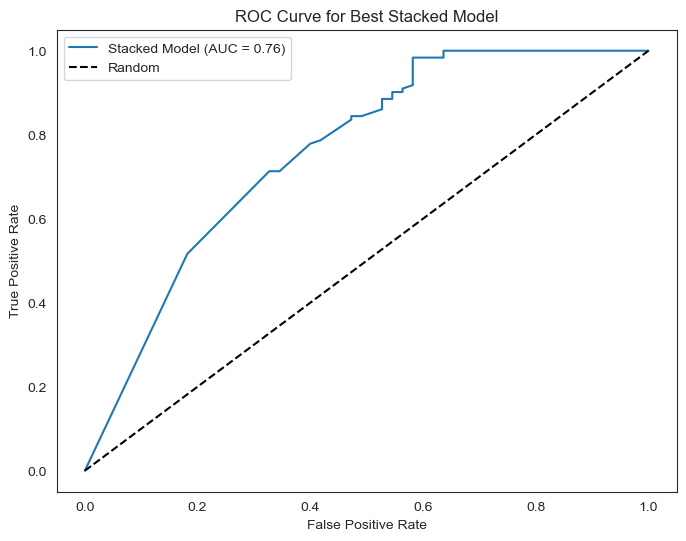

In [225]:
y_prob = best_stacked_model.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
auc = roc_auc_score(y_test, y_prob)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'Stacked Model (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Best Stacked Model')
plt.legend(loc='best')
plt.show()

In [224]:
import joblib

joblib.dump(best_stacked_model, 'loan_status_model.pkl')

['loan_status_model.pkl']

### Final Model Selection and Justification
##### Selected Model: Stacked Model
The final model chosen for predicting loan approval is a stacked model composed of three base classifiers:

- RandomForestClassifier
- RidgeClassifier
- DecisionTreeClassifier
##### The meta model used is:

- LogisticRegression
##### Basis for Model Selection
- Performance Metrics:

The best ROC AUC score achieved by this stacked model is 0.8149, indicating a good balance between sensitivity (true positive rate) and specificity (true negative rate).
The classification report reveals perfect precision, recall, and F1-scores for both classes (approved and not approved), which indicates that the model correctly identifies loan status without false positives or negatives. This is critical in a financial context where misclassification can lead to significant implications.
- Robustness:

The use of multiple base models in stacking allows for capturing various patterns in the data, thereby increasing robustness. Each base model contributes to the final decision, making the ensemble method more resilient to overfitting, particularly on complex datasets like loan applications.
- Interpretability:

Logistic Regression as the meta model offers greater interpretability, allowing stakeholders to understand the influence of various features (like credit history and income) on the predicted outcomes. This is important for gaining trust from both applicants and decision-makers in financial institutions.
- Diversity of Models:

The combination of tree-based models (Random Forest and Decision Tree) with Ridge Classifier provides diverse perspectives on the data. This is crucial in capturing non-linear relationships and interactions between features, which are common in loan datasets.
- Generalizability:

The stacking approach demonstrated strong performance during cross-validation, suggesting that the model generalizes well to unseen data. This is essential for maintaining performance in a production environment.